# Model Selection and Exploration

Now that we have cleaned our indicators from the previously described problems we will be focusing in selecting a good model to perform **text similarity**.

When working with **NLP** and **text similarity** there are a few ways in which we can approach the problem, being one of the most used the **vectorizers**. This type of algorithms **count the words** present in a sentence and check if they're in other sentence we are comparing, so the *more words* exist in both texts the *more similar* they will be. The most well-known method for doing so is the **TF-IDF Vectorizer**, it is better than the basic **Count Vectorizer** as it considers **overall document weightage** of a word, resulting in a much less biased model.

Even though these algorithms are decent for simple tasks, in this case we will have tons of text data from formal documents including synonyms and very specific words that won't be repeated as much, thus we will not be using them but instead we will try to apply **pre-trained transformers** (*word embeddings*) from **HuggingFace**, specifically we will try the next three models (selected by the performance ranking that can be found [here](https://www.sbert.net/_static/html/models_en_sentence_embeddings.html)):

* **all-mpnet-base-v2** - Best performance overall, not very heavy.

* **gtr-t5-xxl** - Huge model trained with 2B+ question-answer pairs, slightly better overall performance than **sentence-t5-xxl**.

* **all-roberta-large-v1** - Third best performing sentence embedding, not as heavy as **gtr-t5-xxl**.

Unfortunately, the **gtr-t5-xxl** model is too big to load it into our RAM, so we will instead replace it with (the apparently deprecated) **stsb-roberta-large**.

## Environment

### Libraries

In [1]:
# Base
import numpy as np
import pandas as pd
import pickle

# Visualization
from IPython.display import Markdown, display
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.graph_objects as go
from plotly.subplots import make_subplots
from plotly.graph_objs import FigureWidget
import plotly.express as px
import ipywidgets as widgets
sns.set_style("darkgrid")
plt.rcParams['figure.dpi'] = 300

#Sentence Transformes framework (HuggingFace)
from sentence_transformers import SentenceTransformer

# Scipy 
from scipy.stats import chi2_contingency

# Metrics
from sklearn.metrics import confusion_matrix, accuracy_score, f1_score
from sklearn.metrics.pairwise import cosine_similarity

# Unsupervised Learning
from sklearn.cluster import KMeans
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler

### Download and Load Models & Indicators

In [2]:
transformers = {
    'mpnet': SentenceTransformer('all-mpnet-base-v2'),
    'roberta_all': SentenceTransformer('all-roberta-large-v1'),
    'roberta_stsb': SentenceTransformer('stsb-roberta-large'),
}

base_indicators = pd.read_csv("Indicators/clean_indicators.csv")

## Model Selection

As we do not have pairs of sentences **to train** or to **evaluate** the model, we will encode the indicators and make two clusters, interpreting one will be **general** and the other will be **cultural** so we can have an idea of which of the models perform the best. This will **not** be an ndicators Analysis, but rather check whether or not the following models will be able to handle our data.

In [3]:
indicators = base_indicators.copy()
encoded = {model: transformer.encode(indicators['indicator']) for model, transformer in transformers.items()}
kmean_results = {model: KMeans(n_clusters=2, random_state=42).fit_predict(encoded) for model, encoded in encoded.items()}

for model, result in kmean_results.items():
    indicators[model] = result

indicators['type'] = indicators['type'].map({'general': 0, 'cultural': 1})

In [4]:
accuracy = confusion_matrices = {model: accuracy_score(indicators['type'], indicators[model]) for model in transformers}
f1_score = confusion_matrices = {model: f1_score(indicators['type'], indicators[model]) for model in transformers}
confusion_matrices = {model: confusion_matrix(indicators['type'], indicators[model]) for model in transformers}

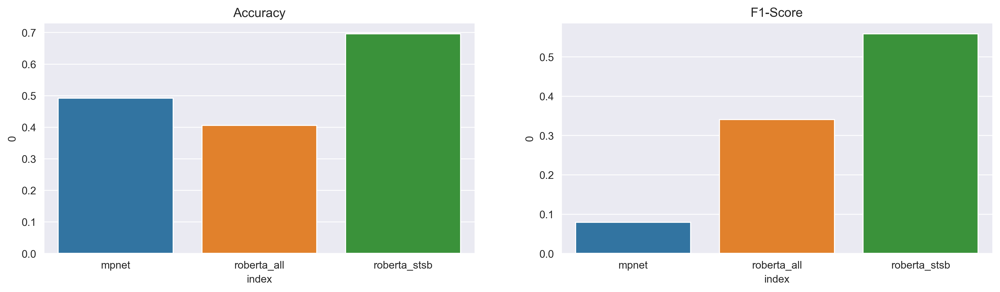

In [5]:
fig, axes = plt.subplots(1, 2, figsize=(16, 4))

sns.barplot(data=pd.Series(accuracy).reset_index(), x='index', y=0, ax=axes[0]).set(title='Accuracy');
sns.barplot(data=pd.Series(f1_score).reset_index(), x='index', y=0, ax=axes[1]).set(title='F1-Score');

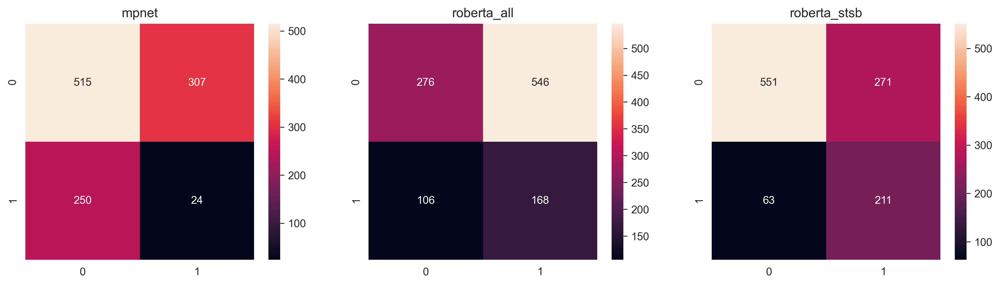

In [6]:
fig, axes = plt.subplots(1, 3, figsize=(16, 4))

for index in range(len(transformers)):
    model = list(transformers.keys())[index]
    sns.heatmap(confusion_matrices[model], annot=True, fmt='.4g', ax=axes[index]).set(title=model);

Surprisingly, the **MPNET** turns out to be very far from what we expected. It doesn't mean it is worse, but for our objective it is not as good as the other two, as it's worse in every aspect. The **Roberta-All** has a slightly better accuracy than the **Roberta-stsb**, but the later one has a considerably higher **F1-Score** as well as a better distributed confusion matrix. With this in mind, we will be using for this project the **Roberta-stsb** model.

## Model Exploration 

Now that we have chosen a model we will be **exploring** what it has to offer, starting with a **3D visualization** of our indicators when compressed through a *three components* **PCA** to visually understand if there is a difference between **cultural** (*red*) and **general** (*blue*) indicators.

In [7]:
roberta_stsb = transformers["roberta_stsb"]

pca_df = pd.DataFrame(PCA(n_components=3).fit_transform(roberta_stsb.encode(indicators["indicator"])))
pca_df = pd.concat([indicators[["indicator", "type"]], pca_df], axis=1)
pca_df["type"] = pca_df["type"].map({0: 'general', 1: 'cultural'})

In [8]:
fig = px.scatter_3d(pca_df,
                    x=0,
                    y=1,
                    z=2,
                    color='type',
                    hover_data=['indicator'],
                    title='3 Components PCA Visualization for indicator type')

fig.update(layout_coloraxis_showscale=False)

We see there's indeed a **reasonable difference** between the **two types of indicators**, even though it is not as strong as it could be. 

In order to understand if the model is good enough to accomplish what we need, we will try to cluster the three components into different groups so we can have smaller and more consistent chunks of indicators. In order to do that we will use the   **KMeans** algorithm.

#### KMeans Optimization

In [9]:
# Check optimal number of clusters
SC = StandardScaler()
clustering_df = pd.DataFrame(SC.fit_transform(pca_df[[0, 1, 2]]), index=pca_df["indicator"])

distortions = [KMeans(n_clusters=k).fit(clustering_df).inertia_ for k in range(1, 20)]

distortions_derivative = [0]
for dist in range(len(distortions) - 1):
    distortions_derivative.append((distortions[dist] - distortions[dist + 1]) / distortions[dist])

C:\Users\javid\anaconda3\envs\PyTorch\lib\site-packages\sklearn\cluster\_kmeans.py:1039: UserWarning:

KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=5.



In [10]:
fig = make_subplots(rows=2, cols=1, shared_xaxes=True)

distortions_plot = go.Scatter(x=list(range(len(distortions))), y=distortions)
distortions_derivative_plot = go.Scatter(x=list(range(len(distortions_derivative))), y=distortions_derivative)

fig.add_trace(distortions_plot, row=1, col=1)
fig.add_trace(distortions_derivative_plot, row=2, col=1)
fig.update_xaxes(title_text="Absolute Value", row=1, col=1)
fig.update_xaxes(title_text="Derivative Value", row=2, col=1)

fig.update_layout(title='Elbow Method', showlegend=False, height=750)

As we can see the best number of clusters for having the most efficient indicator representation is **3**. In the plot below you can **click on the legend** (*type* in the right side *general - cultural*) to hide the type value you want to ignore so you can focus in the distribution of one of them.

In [11]:
clustering_df['cluster'] = KMeans(n_clusters=3, random_state=42).fit(clustering_df).predict(clustering_df)
clustering_df = pd.concat([clustering_df, pca_df.set_index("indicator")["type"]], axis=1)

fig = px.scatter_3d(clustering_df.reset_index(),
                    x=0,
                    y=1,
                    z=2,
                    color='cluster',
                    symbol='type',
                    hover_data=['indicator'],
                    title='3 Components PCA and 3 Clusters visualization')

fig.update(layout_coloraxis_showscale=False)

#### Chi-Square (Contingency Table)

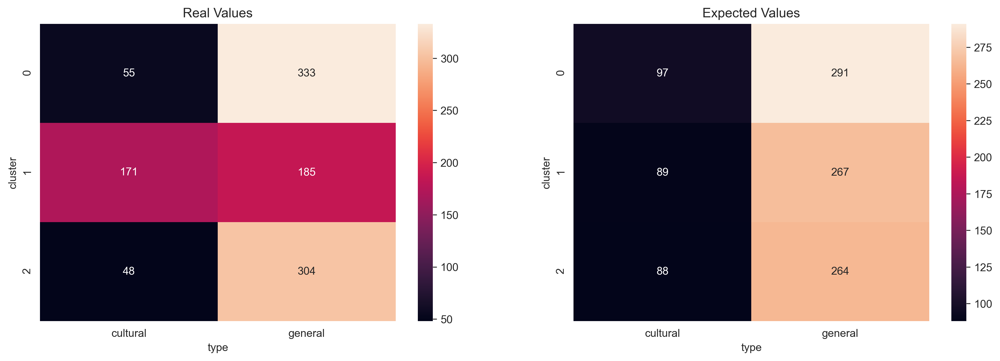

In [12]:
real_values = clustering_df.groupby(["cluster", "type"])[0].count().unstack()
expected_values = pd.DataFrame(chi2_contingency(real_values)[-1])
expected_values.columns = real_values.columns
expected_values.index = real_values.index

fig, axes = plt.subplots(1, 2, figsize=(16, 5))

sns.heatmap(real_values, annot=True, fmt='.4g', ax=axes[0]).set(title='Real Values', );
sns.heatmap(expected_values, annot=True, fmt='.4g', ax=axes[1]).set(title='Expected Values');

The differences between the clusters *are not huge*, but they do exist. We can see in the plot above that the distribution is far from being random, and it shows that the second cluster (*Pink one*) is the one that contains the cultural indicators, with a *p-value* of **2.10e-32**, completely rejecting the null hypothesis.

This is due to the **low number of cultural indicators** compared to the general ones. As we are just using **3 clusters** we should expect 1096 / 3 indicators for each group approximately (around *365*), but we only have **274 cultural indicators** and some of them are not that exclusive so we can expect some "false negatives". Overall, the ideas behind these representations can be summarized as:

* **Blue Cluster**: Water, Waste, Electricity, Pollution, Vegetation and Green Saces (**Environmental Cluster** - Mostly General indicators)


* **Pink Cluster**: Landscape, Archeology, Culture, Identity and Emergency Services (**Social Impact Cluster** - Mostly cultural indicators, although it contains not only culture but the human impact in the environment)


* **Yellow Cluster**: Economy, Sociology, Accesibility, Transport and Architecture (**Economy and Organisation Cluster** - Mostly general indicators, although it has a few more cultural indicators that the Environmental cluster)

Overall it seems pretty good, and it is describing all the data only with three dimensions. We will now try to reduce the original dimensions of the base encoder, but not as much as we did so it can be even more precise for this task.

### Fine Tuning (PCA Optimization)

In order to "fine-tune" the model (it's not really fine tuning as we're not looking to improve its "accuracy" or any other metric as it's unsupervised learning) we will **reduce the dimensionality of the encoder** to a fair number that is not 3 and so preventing both, **overfitting and underfitting**.

In [13]:
explained_variance = {
    "explained_variance": [],
    "columns_number": []
}

encoded_indicators = pd.DataFrame(list(roberta_stsb.encode(base_indicators["indicator"])))

for n_components in range(1, 100, 1):
    explained_variance["explained_variance"].append(n_components / 100)
    pca = PCA(n_components=n_components/100)
    explained_variance["columns_number"].append(len(pd.DataFrame(pca.fit_transform(encoded_indicators)).columns))

In [14]:
pca_df = pd.DataFrame(explained_variance)
pca_df["explained_variance"] = pca_df["explained_variance"] * 100
pca_df["gain_per_column_added"] = (pca_df.apply(lambda x: x["explained_variance"], axis=1) -
                                   pca_df.shift().apply(lambda x: x["explained_variance"], axis=1)) / \
                                  (pca_df.apply(lambda x: x["columns_number"], axis=1) - 
                                   pca_df.shift().apply(lambda x: x["columns_number"], axis=1))

pca_df["gain_per_column_added"] = pca_df["gain_per_column_added"].fillna(2).apply(lambda x: 2 if x==np.inf else x)

In [15]:
pca_df["gain_per_column_added"] = (pca_df.apply(lambda x: x["explained_variance"], axis=1) - pca_df.shift().apply(lambda x: x["explained_variance"], axis=1)) / (pca_df.apply(lambda x: x["columns_number"], axis=1) - pca_df.shift().apply(lambda x: x["columns_number"], axis=1))

fig = go.Figure(layout_title_text='% Explained Variance by Nº Of PCA components')
fig.add_trace(go.Scatter(x=pca_df["columns_number"], 
                         y=pca_df['explained_variance'] / 100,
                         name='% Explained Variance'))

fig.update_layout(yaxis_tickformat='.0%', yaxis_title='% Explained Variance', xaxis_title='Nº Of Components')

In this graph we can see the explained variance based in the PCA number of components, and it is clear that most of the variance is explained by less than **100** components (**84%**) but we can even reduce more this number without losing so much information as **50** components would be enough to explain the **70%** of the variance. We will take a look closer to see the optimum number of components.

In [16]:
fig = make_subplots(rows=2, cols=1)

explained_plot = go.Scatter(x=list(range(100)), y=pca_df["explained_variance"])
explained_plot_columns = go.Scatter(x=list(range(100)), y=pca_df["columns_number"])
explained_derivative_plot = go.Scatter(x=pca_df["columns_number"], y=pca_df["explained_variance"] / 100)
explained_derivative_plot_columns = go.Scatter(x=pca_df["columns_number"], y=pca_df["gain_per_column_added"])

fig.add_trace(explained_plot, row=1, col=1)
fig.add_trace(explained_plot_columns, row=1, col=1)
fig.add_trace(explained_derivative_plot, row=2, col=1)
fig.add_trace(explained_derivative_plot_columns, row=2, col=1)
fig.update_xaxes(title_text="Explained Variance by Nº of Components", row=1, col=1)
fig.update_xaxes(title_text="Marginal increase by column added", row=2, col=1)

fig.update_layout(title='Nº Of PCA components selection', showlegend=False, height=850)

The most important breakpoints we have when looking at the graph are the following:

* **44% Explained Variance**: 16 columns

* **58% Explained Variance**: 29 columns

* **72% Explained Variance**: 52 columns

Looking at these breakpoints, it seems that the best option would be to retain **52 columns** and get the **72%** of the explained variance to prevent overfitting.

### Error Analysis

Now that we have created the **encoding matrix** we can look at the indicators that have the most similarities between them (computing it with *cosine similarity*) and the ones that don't really match with any other, so we can validate that our model is working properly.

In [17]:
single_indicators = indicators["indicator"].drop_duplicates()
pca_final_df = roberta_stsb.encode(list(single_indicators))
fitted_PCA = PCA(n_components=52).fit(pca_final_df)
pca_final_df = pd.DataFrame(fitted_PCA.transform(pca_final_df), index=single_indicators)
cosine_df = pd.DataFrame(cosine_similarity(pca_final_df), index=single_indicators, columns=single_indicators)
most_similar_values = cosine_df.applymap(lambda x: 0 if round(x, 4)==1 else x).max().sort_values(ascending=False)

fig = px.histogram(most_similar_values, title='Distribution of maximum similarity found by indicators')
fig.add_vline(x=most_similar_values.median(),
              line_color="red",
              annotation_text=f'median: {round(most_similar_values.median(), 2)}',
              annotation_font_color="red")
fig.update_layout(showlegend=False)

As we can see in the above histogram, most of the indicators (+50%) are fairly good matches, considering +0.75 as a good match. We will now check the **best** and **worst** matches between indicators to see its performance in extreme cases.

In [18]:
closest_indicators = {"indicator": [],
                      "closest_indicator": [],
                      "similarity": []}

for indicator in most_similar_values.index:
    closest_indicators["indicator"].append(indicator) 
    closest_indicators["closest_indicator"].append(cosine_df[indicator].sort_values().reset_index().iloc[-2]["indicator"]) 
    closest_indicators["similarity"].append(cosine_df[indicator].sort_values().reset_index().iloc[-2][indicator]) 
    
matches = pd.DataFrame(closest_indicators).sort_values("similarity", ascending=False)

#### Best Matches

In [19]:
display(Markdown(matches[:15].to_markdown()))

|    | indicator                                                                                                | closest_indicator                                                                                        |   similarity |
|---:|:---------------------------------------------------------------------------------------------------------|:---------------------------------------------------------------------------------------------------------|-------------:|
|  0 | Access to public transportation                                                                          | Access to public transport                                                                               |     0.998016 |
|  1 | Access to public transport                                                                               | Access to public transportation                                                                          |     0.998016 |
|  2 | Renewable Energy Production                                                                              | Renewable energy                                                                                         |     0.981183 |
|  3 | Renewable energy                                                                                         | Renewable Energy Production                                                                              |     0.981183 |
|  4 | Google hits for the string city name & climate change & urban heat island (hits per million inhabitants) | Google hits for the string city name & climate change & heatwave (hits per million inhabitants)          |     0.980117 |
|  5 | Google hits for the string city name & climate change & heatwave (hits per million inhabitants)          | Google hits for the string city name & climate change & urban heat island (hits per million inhabitants) |     0.980117 |
|  6 | Google hits for the string city name & climate change & flood (hits per million inhabitants)             | Google hits for the string city name & climate change & sea level rise (hits per million inhabitants)    |     0.977652 |
|  7 | Google hits for the string city name & climate change & sea level rise (hits per million inhabitants)    | Google hits for the string city name & climate change & flood (hits per million inhabitants)             |     0.977652 |
|  8 | Average disposable annual household income – EUR                                                         | Median disposable annual household income - EUR                                                          |     0.968229 |
|  9 | Median disposable annual household income - EUR                                                          | Average disposable annual household income – EUR                                                         |     0.968229 |
| 10 | Water consumption                                                                                        | Water use                                                                                                |     0.966815 |
| 11 | Water use                                                                                                | Water consumption                                                                                        |     0.966815 |
| 12 | Public Transport capacity                                                                                | Capacity of public transport                                                                             |     0.966631 |
| 13 | Capacity of public transport                                                                             | Public Transport capacity                                                                                |     0.966631 |
| 14 | Proportion of single-parent families;                                                                    | Proportion of households that are lone-parent households                                                 |     0.961126 |

We can see in the top 15 matches that most of them are **lexic variations** (*Access to public transport* - *Access to public transportation*), **minimal changes in long sentences** (*heatwave* - *urban heat island*) and the most important case, **synonyms recognition** or context (*Water use* - *Water consumption*).

* **Lexic Variations** -> Properly detected (*Vectorizers + Lemmatizers* should work fine too)
* **Small changes in Long Sentences** -> Properly detected (*Vectorizers + Lemmatizers* should work fine too)
* **Synonym Recognition** -> Properly detected (*Vectorizers + Lemmatizers* should *NOT* work fine as it is word-based)

In conclusion, for the best Matches our model works pertty well, even better than expected in some cases (*Consumption - Use*)

#### Worst Matches

In [20]:
display(Markdown(matches[-15:].to_markdown()));

|      | indicator                                                                                                                                                           | closest_indicator                                                    |   similarity |
|-----:|:--------------------------------------------------------------------------------------------------------------------------------------------------------------------|:---------------------------------------------------------------------|-------------:|
| 1081 | Presence of local government projects and other agents                                                                                                              | Number of products of denominated origin                             |     0.456548 |
| 1082 | Pollution of the façade with modern stylistics                                                                                                                      | Innovative Economic Activities                                       |     0.454629 |
| 1083 | Foreclosures                                                                                                                                                        | Viewsheds                                                            |     0.450301 |
| 1084 | Proportion of residents who say that they would like to regularly access traditionally/commonly harvested natural resources and are able to do so as much as needed | Access to parks & recreation areas                                   |     0.450093 |
| 1085 | Statues (sacral/non sacral)                                                                                                                                         | Percentage of Aboriginal people speaking traditional languages       |     0.448832 |
| 1086 | Percentage of citizens archiving electronic health records (e-health cards)                                                                                         | Elderly population                                                   |     0.448824 |
| 1087 | Biodiversity                                                                                                                                                        | Places heterotopic                                                   |     0.442744 |
| 1088 | Study trails                                                                                                                                                        | Creating cultural trails                                             |     0.44038  |
| 1089 | Site micro-climate                                                                                                                                                  | personality and neighbourhood                                        |     0.438907 |
| 1090 | Patch size of areas of a topographic changes                                                                                                                        | Land cover change                                                    |     0.436987 |
| 1091 | Presence of SD strategies                                                                                                                                           | Presence of play equipment management and maintenance guidelines     |     0.433104 |
| 1092 | An employee spleen                                                                                                                                                  | Proportion of working age population qualified at level 5 or 6 ISCED |     0.432489 |
| 1093 | Ancillary facilities                                                                                                                                                | Archeological reserves                                               |     0.43135  |
| 1094 | Rareness (% of area in the study area)                                                                                                                              | Number of days ozone O3 concentrations exceed 120 μg/m3              |     0.429388 |
| 1095 | Pubic space                                                                                                                                                         | Open Space                                                           |     0.399274 |

Looking at the worst matches we can see very good matches (*Anthropogenic marks and footprints of human influence - Ethnic heterogeneity*) and some bad matches (*Site micro-climate - personality and neighbourhood*) as well as some cleaning errors in translation (*pubic spaces*, although it is able to match it reasonably well). It is not clear whether we should keep these indicators as they might interfere in the final result (as overfitting), in order to decide properly we will check 15 more indicators.

In [21]:
display(Markdown(matches[-30:-15].to_markdown()));

|      | indicator                                                                     | closest_indicator                                                          |   similarity |
|-----:|:------------------------------------------------------------------------------|:---------------------------------------------------------------------------|-------------:|
| 1066 | Critical distances in the network                                             | Importance as a knowledge hub                                              |     0.494853 |
| 1067 | Cemetries                                                                     | Emergency Operation Centers                                                |     0.493737 |
| 1068 | International embeddedness/International integration                          | Aggregation index of Green Space                                           |     0.493407 |
| 1069 | Sopping mall                                                                  | Wealth Index                                                               |     0.491618 |
| 1070 | Places of events                                                              | Number of protected designated sites                                       |     0.491437 |
| 1071 | Experience with local natural- non-agricultural and non-timber products       | Existence of fruit trees                                                   |     0.491392 |
| 1072 | Adoption of telemedicine (remote diagnosis and treatment)                     | Availability and penetration of e-learning and distance  education systems |     0.489481 |
| 1073 | Consumption                                                                   | Affordability                                                              |     0.487507 |
| 1074 | Standard of living                                                            | Median household income                                                    |     0.482148 |
| 1075 | AHB                                                                           | GHG emissions                                                              |     0.478926 |
| 1076 | Selective collect                                                             | Tax burden                                                                 |     0.47613  |
| 1077 | Patent Applications / Registration for Inhabitant                             | Toll parking                                                               |     0.471526 |
| 1078 | Commercial activities linked to Crats, Artisans, Craftsmanship,               | Organizations listed on Councils Artist Register                           |     0.469919 |
| 1079 | Ethnic, cultural, and gender equality (income, access to opportunities, etc.) | Accessibility for disadvantaged                                            |     0.466877 |
| 1080 | Anthropogenic marks and footprints of human influence                         | Ethnic heterogeneity                                                       |     0.463319 |

Again we face the same problem, but it seems it is better than the last 15 as it's not completely clear that these indicators are indeed bad matches (excluding *Porosity and Critical distances*) but there are some that doesn't find a proper match (*Critical distances in the network*). Even if there are some that are not as good as they should be, the model works well enough not to remove indicators under a certain threshold.

#### Random Matches

In [22]:
display(Markdown(matches.sample(15, random_state=42).sort_values(by='similarity').to_markdown()));

|      | indicator                                                                                      | closest_indicator                                                                            |   similarity |
|-----:|:-----------------------------------------------------------------------------------------------|:---------------------------------------------------------------------------------------------|-------------:|
| 1014 | Access and type of sanitation facility                                                         | Access to potable water and use of waste water systems                                       |     0.548573 |
|  849 | Design Review                                                                                  | Construction Plan                                                                            |     0.639267 |
|  761 | Reduced Parking Footprint                                                                      | Restricted traffic zones                                                                     |     0.6719   |
|  666 | Landscape (viewsheds and landmarks)                                                            | Diversity of landscape                                                                       |     0.704222 |
|  636 | Freshwater scarcity                                                                            | Water availability                                                                           |     0.713012 |
|  631 | Citizen education campaigns                                                                    | Education                                                                                    |     0.714041 |
|  568 | Cultural events related to olive farming                                                       | Stakeholder appreciation of the historical significance of olive farming                     |     0.73212  |
|  545 | Investments required for restoration of cultural property                                      | Availability of cultural site maintenance fund and resource                                  |     0.737657 |
|  486 | Expenditure on Infrastructure                                                                  | Infrastructure networks                                                                      |     0.755485 |
|  270 | Percentage of Aboriginal people speaking traditional languages                                 | Percentage of Aboriginal participating in traditional activities                             |     0.824006 |
|  107 | Quantity of waste recycled (in tons p. year)                                                   | Proportion of recycled waste (per total kilogram of waste produced/per person)               |     0.884509 |
|   96 | housing diversity (age in place), housing conditions                                           | Housing Diversity                                                                            |     0.887601 |
|   56 | Historical/cultural heritage                                                                   | Heritage and Cultural Identity                                                               |     0.922587 |
|   51 | Google hits for the string city name & climate change & drought (hits per million inhabitants) | Google hits for the string city name & climate change & flood (hits per million inhabitants) |     0.930429 |
|   44 | Share of population served by Green Space > 0.5 ha                                             | Share of blocks served by Green Space > 0.5 ha                                               |     0.940131 |

We can see in this random sample that our model does **work very well** regardless of the similarity value, even in the "*bad matches*" there were some accurate relations between some indicators that were not obvius (*Activity rate - Growth rate*). We will leave it as it is for now.

## General and Cultural Indicators Matching

One of our objectives was to match **general** with **cultural** indicators, and so we will be doing here. Right below there is a sample of these matches:

In [23]:
indicator_type_match_df = cosine_df.join(clustering_df["type"]).T.join(clustering_df["type"])

final_general_matches = {}
final_cultural_matches = {}


cultural_matches = indicator_type_match_df[indicator_type_match_df.loc["type"] != 'cultural'].T
cultural_matches = cultural_matches[cultural_matches["type"] == 'cultural'].drop(columns='type').T
general_matches = indicator_type_match_df[indicator_type_match_df.loc["type"] != 'general'].T
general_matches = general_matches[general_matches["type"] == 'general'].drop(columns='type').T

for general in general_matches:
    tmp_indicators = general_matches.sort_values(by=general, ascending=False)[:5][general]
    final_general_matches[general] = {"indicator": list(tmp_indicators.index), 
                                       "similarity": list(tmp_indicators.values)}

for cultural in cultural_matches:
    tmp_indicators = cultural_matches.sort_values(by=cultural, ascending=False)[:5][cultural]
    final_cultural_matches[cultural] = {"indicator": list(tmp_indicators.index), 
                                       "similarity": list(tmp_indicators.values)}

final_general_matches_df = pd.DataFrame(final_general_matches).T
final_general_matches_df["top"] = [list(range(1, 6)) for row in range(len(final_general_matches_df))]
final_general_matches_df = final_general_matches_df.apply(pd.Series.explode).reset_index().groupby(["index", "top"]).sum().unstack()
    
final_cultural_matches_df = pd.DataFrame(final_cultural_matches).T
final_cultural_matches_df["top"] = [list(range(1, 6)) for row in range(len(final_cultural_matches_df))]
final_cultural_matches_df = final_cultural_matches_df.apply(pd.Series.explode).reset_index().groupby(["index", "top"]).sum().unstack()

final_general_matches_df["type"] = 'general'
final_cultural_matches_df["type"] = 'cultural'

final_matches_df = pd.concat([final_general_matches_df, final_cultural_matches_df])
final_matches_df["similarity"] = final_matches_df["similarity"].applymap(lambda x: str(round(x, 2)).replace('.', ','))


matches_df = final_matches_df.sample(15, random_state=42)
matches_df.columns = ['_'.join([str(j) for j in i if j != '']) for i in matches_df.columns]

display(Markdown(matches_df.to_markdown()));

| index                                                                     | indicator_1                                                                | indicator_2                                                           | indicator_3                                      | indicator_4                                                 | indicator_5                                                                                                   | similarity_1   | similarity_2   | similarity_3   | similarity_4   | similarity_5   | type     |
|:--------------------------------------------------------------------------|:---------------------------------------------------------------------------|:----------------------------------------------------------------------|:-------------------------------------------------|:------------------------------------------------------------|:--------------------------------------------------------------------------------------------------------------|:---------------|:---------------|:---------------|:---------------|:---------------|:---------|
| Amount of land owned by the household                                     | Land lot sizes                                                             | The age of land                                                       | Landscape value index                            | Acres of preserved land                                     | Proximity to residential areas                                                                                | 0,66           | 0,52           | 0,48           | 0,45           | 0,45           | general  |
| Proportion of people who have moved in the last year;                     | No. of visitors and tourists                                               | Patch size of areas of a topographic changes                          | Distance from the centre of the old town zone    | Change in tradition and customs                             | Monitor new knowledge and changes in traditional use patterns                                                 | 0,42           | 0,4            | 0,4            | 0,38           | 0,38           | general  |
| Area of the park                                                          | Parkland                                                                   | Areas of importance for landscape-related recreational use or tourism | Places of socialisation (parks, benches, etc.)   | Sense of place landscapes                                   | natural and cultural landscapes and components of landscape with importance for natural and cultural heritage | 0,88           | 0,64           | 0,63           | 0,52           | 0,45           | general  |
| Research and development expenditure                                      | Development of a public arts fund                                          | Research  centers                                                     | Funds for building renovation                    | Investments required for restoration of cultural property   | Availability of cultural site maintenance fund and resource                                                   | 0,45           | 0,44           | 0,43           | 0,41           | 0,39           | general  |
| Pedestrian zones                                                          | Parking places in building surroundings                                    | Spaces rural pedestrian                                               | Compliance with tourist guidelines               | No. of visitors and tourists                                | Museums                                                                                                       | 0,4            | 0,37           | 0,34           | 0,31           | 0,27           | general  |
| Children and young people from 4 to 17years old at school                 | Educational                                                                | Promotion and education in Past Identities programmes and spaces      | Workspaces of Artisans, Intellectuals & youth    | Number of cultural–educational programs.                    | Scientific/educational landscapes                                                                             | 0,68           | 0,52           | 0,48           | 0,39           | 0,38           | general  |
| Urban sprawl                                                              | Number of cultural sites affected by natural disasters and urban expansion | Urban green space                                                     | Porosity                                         | Attractive streetscape                                      | Enhancement urban green                                                                                       | 0,48           | 0,45           | 0,43           | 0,37           | 0,35           | general  |
| Applications for mobile devices                                           | Number of citizens initiatives                                             | Social preferences                                                    | No. of visitors and tourists                     | Patch size of areas of a topographic changes                | Recreation (motorized/non-motorized)                                                                          | 0,44           | 0,4            | 0,37           | 0,34           | 0,31           | general  |
| City's Employment / UNEmployment Rate, Measures to Combat Unployment      | Effect on local business and jobs                                          | Parking places in building surroundings                               | Organizations listed on Councils Artist Register | Pressure of parking                                         | Type and amount of training given to tourism employees                                                        | 0,51           | 0,4            | 0,36           | 0,35           | 0,33           | general  |
| Safe streets                                                              | Safeguarding the terraced landscape                                        | Percent satisfied with cultural integrity/sense of security           | Comfortable use                                  | Plan that does not spoil natural and historical environment | Well-preserved village                                                                                        | 0,58           | 0,55           | 0,47           | 0,4            | 0,39           | general  |
| Regional Materials                                                        | Barrow (traditional elements)                                              | Archeological reserves                                                | Historic relic indicator                         | Rareness (% of area in the study area)                      | Memorial stones                                                                                               | 0,49           | 0,44           | 0,43           | 0,41           | 0,39           | general  |
| Google hits for the string climate change (hits per thousand inhabitants) | Regional products sales (% PDO label)                                      | Rareness (% of area in the study area)                                | Frequency of sharing salmon legends annually     | Revenues from tourism (% farm income)                       | Nostalgia                                                                                                     | 0,44           | 0,34           | 0,29           | 0,27           | 0,26           | general  |
| Presence of major international and domestic enterprises and entities     | Effect on local business and jobs                                          | Listed built elements                                                 | Number of products of denominated origin         | Number of man-made structures with a function               | Workspaces of Artisans, Intellectuals & youth                                                                 | 0,42           | 0,41           | 0,39           | 0,38           | 0,37           | general  |
| Churches                                                                  | Safe cultural and religious sites                                          | Primary school                                                        | Feeling of belonging                             | Police emergency coverage                                   | Childcare facilities                                                                                          | 0,46           | 0,45           | 0,44           | 0,4            | 0,4            | cultural |
| Pressure of parking                                                       | Parking fees                                                               | Toll parking                                                          | Parking facilities                               | Restricted traffic zones                                    | Public car parking availability                                                                               | 0,85           | 0,77           | 0,76           | 0,72           | 0,69           | cultural |

In [24]:
pca_final_df

,0,1,2,3,4,5,6,7,8,9,...,42,43,44,45,46,47,48,49,50,51
indicator,,,,,,,,,,,,,,,,,,,,,
Harmony with the surroundings,7.302537,-2.408873,0.143063,-2.265889,2.014995,0.670274,-1.123729,-0.309706,1.052524,4.084384,...,-2.543272,-0.794690,-1.111219,3.275222,-1.611975,-1.104352,0.297776,1.199224,2.466234,-0.520853
Amenities,-2.933604,-2.632437,1.368790,3.429755,-2.281244,-6.079383,0.005454,-2.928803,1.672140,7.166666,...,-0.694756,0.348376,-0.244252,0.416478,0.682858,-2.617404,2.598094,-0.993892,-0.176385,-0.008431
Cycling facilities,0.274080,-1.670565,-3.095247,-0.016069,-0.435552,-3.060044,-4.237701,0.014930,0.178895,0.458123,...,0.897883,-1.435738,-1.246570,1.896118,-4.340008,0.274925,-1.966479,2.900820,3.212792,-3.461914
Walking facilities,-1.787744,-3.655973,-0.684314,2.156769,3.031736,-6.926113,-2.662718,3.158245,-7.944648,-1.767451,...,1.176598,-0.857538,-0.507788,-4.626858,-3.155993,-0.610083,-0.542177,-3.499138,-1.769724,0.240220
Education facilities,2.027051,-7.998107,-0.475367,5.137316,-2.027634,-7.706607,1.693507,-2.218977,3.804134,2.779626,...,0.475609,0.381501,-0.333748,-1.672059,-2.069212,0.295487,-0.396199,1.104001,0.589334,-0.221055
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
Experience with local natural- non-agricultural and non-timber products,0.636508,3.213026,9.525928,-5.359886,-1.313472,2.039928,2.311063,-1.543181,2.943828,-0.954798,...,-1.422236,2.892687,1.342152,5.919101,-1.721955,-2.305869,0.403486,1.640069,-3.485437,0.339422
Existence of fruit trees,1.762780,2.954878,9.382515,-0.898168,-0.143405,-3.174093,5.126375,-0.263754,6.399026,-5.126362,...,-3.443469,-1.939426,-0.625717,1.124805,2.781795,-1.029835,2.949119,0.638285,0.958976,1.328200
Anthropogenic marks and footprints of human influence,0.627162,-6.707168,6.666534,0.030049,-1.785034,-0.483283,1.564132,-2.873049,0.971217,-3.736394,...,-0.406166,0.102257,-1.329898,2.212955,1.183224,0.055757,-1.960786,-0.986281,-1.248354,-4.117891


### Indicators Match Visualizer 

In the 3D visualization below we will be able to see the **top 5 matches** for the selected indicator and their positions in the 3 components PCA. Note that this filter **will not be available in the HTML file** as the filter cannot be embedded as a filter, it will only be available in the **notebook version**.

In [25]:
combobox = widgets.Combobox(placeholder='Choose your indicator',
                            options=sorted(list(indicators["indicator"])),
                            description='Indicators:',
                            ensure_option=True,
                            disabled=False)

toggle = widgets.ToggleButton(description='reset', layout={'width': '5%'})

plot_3D = go.Scatter3d(x=clustering_df[0], 
                       y=clustering_df[1],
                       z=clustering_df[2], 
                       text=clustering_df.index,
                       mode='markers',
                       marker=dict(size=5,
                                   color=clustering_df["cluster"],
                                   colorscale='jet',
                                   opacity=0.8))

fw = FigureWidget(data=[plot_3D])
def reset_combobox(tog):
    combobox.value = ''
    
def response(change):
    indicator = combobox.value 
    if indicator:
        with fw.batch_update():
            top_matches = cosine_df[indicator].sort_values(ascending=False)[:6].reset_index()
            new_data = clustering_df[clustering_df.index.isin(list(top_matches["indicator"]))].reset_index()
            new_data = new_data.merge(top_matches, left_on='indicator', right_on='indicator')
            fw.data[0].x = new_data[0]
            fw.data[0].y = new_data[1]
            fw.data[0].z = new_data[2]
            fw.data[0].text = new_data.apply(lambda x: x["indicator"] + ': ' + str(round(x[indicator], 2)) + ' similarity', axis=1)
            
            fw.layout.scene.xaxis = dict(range=[clustering_df[0].min() - 1, clustering_df[0].max() + 1])
            fw.layout.scene.yaxis = dict(range=[clustering_df[1].min() - 1, clustering_df[1].max() + 1])
            fw.layout.scene.zaxis = dict(range=[clustering_df[2].min() - 1 ,clustering_df[2].max() + 1])


combobox.observe(response, names="value")
toggle.observe(reset_combobox, names="value")
container = widgets.HBox([combobox, toggle])
widgets.VBox([container, fw])

## Exporting Model &  Cosine Matrix

In [26]:
final_matches_df.to_csv("Indicators/indicator_matches.csv")
pca_final_df.to_csv('Indicators/encoded_indicators.csv')

with open('Files/fitted_PCA.pickle', "wb") as file:
    pickle.dump(fitted_PCA, file)

In [27]:
#!jupyter nbconvert "Model Selection and Fine Tuning" --to html_toc --TemplateExporter.exclude_input=True -TagRemovePreprocessor.remove_cell_tags="hide"